In [1]:
import xarray as xr
import numpy as np
import pandas as pd

from matplotlib import colors
from matplotlib import pyplot as plt
from cartopy import crs as ccrs

In [2]:
ds1 = xr.open_dataset('/rds/general/user/tk22/home/fire_genesis/'+
                      'ensemble_superior_members.nc')
ds2 = xr.open_dataset('/rds/general/user/tk22/projects/'+
                      'leverhulme_wildfires_theo_keeping/'+
                      'live/start_inputs/genesis_fire_'+
                      'FPAFOD_20020101_20181231.nc')

----
### Difference in low fire area:

In [4]:
data1 = ds1.p.mean(axis = 2)
data2 = ds2.fire.mean(axis = 2) * (data1*0+1)

In [19]:
p_under = (data1 < 10 ** -4).sum()
f_under = (data2 < 10 ** -4).sum()

p_over = (data1 > 10 ** -2).sum()
f_over = (data2 > 10 ** -2).sum()

In [23]:
print(float(p_under / f_under))
print(float(f_over / p_over))

0.6302216929278124
1.422456140350877


---

### Geospatial Means:

In [3]:
def geospatial_map(ds1, ds2, cmap = 'jet'):
    fig = plt.figure(figsize = (6,6))

    ax1 = fig.add_subplot(211, projection=ccrs.PlateCarree())
    ax1.set_global()
    ax1.coastlines()
    ax1.set_xlim(ds1.lon.min() - 0.5, ds1.lon.max() + 0.5)
    ax1.set_ylim(ds1.lat.min() - 0.5, ds1.lat.max() + 0.5)
    data1 = ds1.p.mean(axis = 2).to_numpy()
    im1 = ax1.pcolormesh(
        ds1.lon, ds1.lat, data1,
        norm = colors.LogNorm(vmin = 10**-4, vmax = 10**-1, clip = False),
        transform = ccrs.PlateCarree(),
        cmap = cmap)
    ax1.coastlines()
    ax1.text(-124, 26.5, '(a) Model Mean', color = 'k', fontsize = 12, 
             bbox=dict(facecolor = 'white', edgecolor = 'white'))

    ax2 = fig.add_subplot(212, projection=ccrs.PlateCarree())
    ax2.set_global()
    ax2.coastlines()
    ax2.set_xlim(ds1.lon.min(), ds1.lon.max())
    ax2.set_ylim(ds1.lat.min(), ds1.lat.max())
    data2 = ds2.fire.mean(axis = 2).to_numpy() * (data1*0+1)
    data2[data2 < 10**-10] = 10**-10
    im2 = ax2.pcolormesh(
        ds2.lon, ds2.lat, data2,
        norm = colors.LogNorm(vmin = 10**-4, vmax = 10**-1, clip = False),
        transform = ccrs.PlateCarree(),
        cmap = cmap, zorder = 1)
    
    ax2.text(-124, 26.5, '(b) Observed Mean', color = 'k', fontsize = 12, 
             bbox=dict(facecolor = 'white', edgecolor = 'white'))
    
    plt.subplots_adjust(wspace=0, hspace=0)
    
    fig.subplots_adjust(right=0.9)
    cbar_ax = fig.add_axes([0.935, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(im2, cax = cbar_ax, extend = 'both')
    cbar.set_label('Rate of Wildfire Occurrence', fontsize = 12)
    fontsetter = [t.set_fontsize(12) for t in cbar_ax.get_yticklabels()]
    
    plt.savefig(('/rds/general/user/tk22/home/fire_genesis/'+
                 f'final_paper_plots/paper/geospatial_map.png'), 
                bbox_inches = 'tight', facecolor = 'white', dpi = 600)
    plt.show()
    return

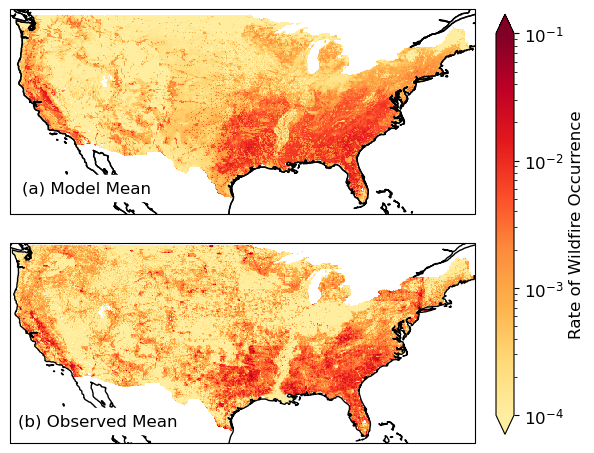

In [4]:
cmap = colors.LinearSegmentedColormap.from_list('', ['#ffeda0', '#fed976', '#feb24c',
                                                     '#fd8d3c', '#fc4e2a', '#e31a1c', '#bd0026', 
                                                     '#800026'])
geospatial_map(ds1, ds2, cmap = cmap)

---

### IAV:

In [55]:
def iav_plot(ds1, ds2):
    mod_counts = ds1.p.resample(date = '1Y').sum().sum(axis = (0,1))
    act_counts = ds2.fire.resample(date = '1Y').sum().sum(axis = (0,1))
    
    plt.figure(figsize = (6,4))
    plt.title('Interannual Variability', fontsize = 13)
    width = 0.4
    plt.bar(act_counts.date.dt.year - width/2, act_counts,
            width, label = 'Observation', color = 'k')
    plt.bar(mod_counts.date.dt.year + width/2, mod_counts,
            width, label = 'Model', color= 'darkgrey')
    plt.xticks(np.arange(2002,2019,3), fontsize = 13)
    plt.yticks(np.arange(0,np.max([np.max(mod_counts), np.max(act_counts)]),2*10**4),
               fontsize= 13)
    plt.xlabel('Year', fontsize = 13)
    plt.ylabel('Total Wildfire Occurrences', fontsize = 13)
    plt.legend(fontsize = 13)
    plt.savefig(('/rds/general/user/tk22/home/fire_genesis/'+
                 'final_paper_plots/paper/iav_bar_chart.png'), 
                bbox_inches = 'tight', facecolor = 'white', dpi = 600)
    plt.show()
    return

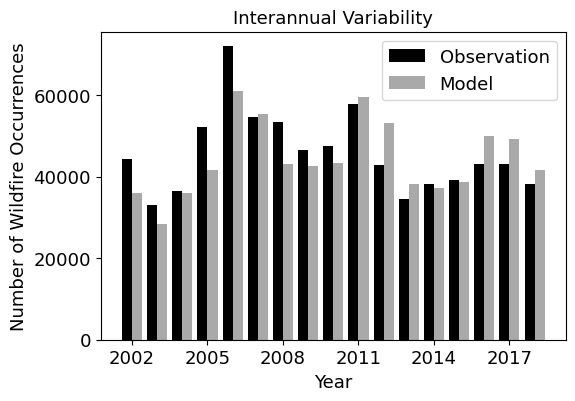

In [54]:
iav_plot(ds1, ds2)

---

### Seasonal Concentration and Phase:

In [13]:
def seasonal_concentration_monthly(x, ds):   
    theta = 2 * np.pi * (ds.date.dt.month - 1) / 12
    lx = np.sum(x * np.cos(theta))
    ly = np.sum(x * np.sin(theta))
    c = np.sqrt(lx**2 + ly**2) / np.sum(x)
    p = np.arctan(lx / ly)
    
    if ly < 0:
        p = p - np.pi
    
    p = p - np.pi/2
    p = -p  
    return c, p

def grid_run_monthly(ds, var = 'p'):
    ds = ds.coarsen({'lat':5,'lon':5}, boundary = 'trim').mean()
    ds = ds.resample(date = '1M').mean()
    arr = ds[var].to_numpy()

    cs = np.zeros((len(ds.lat), len(ds.lon)))
    ps = np.zeros((len(ds.lat), len(ds.lon)))

    for i in range(len(ds.lat)):
        for j in range(len(ds.lon)):
            try:
                c,p = seasonal_concentration_monthly(arr[:,i,j], ds)
            except:
                c,p = seasonal_concentration_monthly(arr[i,j,:], ds)
            cs[i,j] = c
            ps[i,j] = p


    output = xr.Dataset(data_vars =  {'c': (['lat', 'lon'] , cs),
                                      'p': (['lat', 'lon'] , ps)},
                        coords =  {'lat': ds.lat.data,
                                   'lon': ds.lon.data})
    return output

def seasonal_concentration_and_phase(ds1, ds2, cmap1 = 'twilight_shifted', cmap2 = 'viridis_r'):
    mod_season = grid_run_monthly(ds1, var = 'p')
    obs_season = grid_run_monthly(ds2, var = 'fire')

    fig = plt.figure(figsize = (8, 4))

    ax1 = fig.add_subplot(221, projection=ccrs.PlateCarree())
    ax1.set_global()
    ax1.coastlines()
    ax1.set_xlim(ds1.lon.min() - 0.5, ds1.lon.max() + 0.5)
    ax1.set_ylim(ds1.lat.min() - 0.5, ds1.lat.max() + 0.5)
    ax1.text(-124, 26.5, '(a)', color = 'k', fontsize = 13, 
             bbox=dict(facecolor = 'white', edgecolor = 'white'))
    im1 = ax1.pcolormesh(
        obs_season.lon, obs_season.lat, obs_season.p,
        vmin = 0, vmax = 2*np.pi,
        transform = ccrs.PlateCarree(),
        cmap = cmap1)


    ax2 = fig.add_subplot(222, projection=ccrs.PlateCarree())
    ax2.set_global()
    ax2.coastlines()
    ax2.set_xlim(ds1.lon.min() - 0.5, ds1.lon.max() + 0.5)
    ax2.set_ylim(ds1.lat.min() - 0.5, ds1.lat.max() + 0.5)
    ax2.text(-124, 26.5, '(c)', color = 'k', fontsize = 13, 
             bbox=dict(facecolor = 'white', edgecolor = 'white'))
    im2 = ax2.pcolormesh(
        obs_season.lon, obs_season.lat, obs_season.c,
        vmin = 0, vmax = 1,
        transform = ccrs.PlateCarree(),
        cmap = cmap2)


    ax3 = fig.add_subplot(223, projection=ccrs.PlateCarree())
    ax3.set_global()
    ax3.coastlines()
    ax3.set_xlim(ds1.lon.min() - 0.5, ds1.lon.max() + 0.5)
    ax3.set_ylim(ds1.lat.min() - 0.5, ds1.lat.max() + 0.5)
    ax3.text(-124, 26.5, '(b)', color = 'k', fontsize = 13, 
             bbox=dict(facecolor = 'white', edgecolor = 'white'))
    im3 = ax3.pcolormesh(
        mod_season.lon, mod_season.lat, mod_season.p,
        vmin = 0, vmax = 2 * np.pi,
        transform = ccrs.PlateCarree(),
        cmap = cmap1)
    ax3.set_ylabel('Model')


    ax4 = fig.add_subplot(224, projection=ccrs.PlateCarree())
    ax4.set_global()
    ax4.coastlines()
    ax4.set_xlim(ds1.lon.min() - 0.5, ds1.lon.max() + 0.5)
    ax4.set_ylim(ds1.lat.min() - 0.5, ds1.lat.max() + 0.5)
    ax4.text(-124, 26.5, '(d)', color = 'k', fontsize = 13, 
             bbox=dict(facecolor = 'white', edgecolor = 'white'))
    im4 = ax4.pcolormesh(
        mod_season.lon, mod_season.lat, mod_season.c,
        vmin = 0, vmax = 1,
        transform = ccrs.PlateCarree(),
        cmap = cmap2)


    plt.subplots_adjust(wspace = 0.05, hspace = 0.05)

    cbar2 = fig.colorbar(im4, ax = [ax2, ax4], location = 'bottom',
                         ticks = [0,0.5,1], pad = 0.02, 
                         fraction = 0.045 * mod_season.c.shape[1]/mod_season.c.shape[0])
    cbar2.ax.set_xticklabels(['0', '0.5', '1'])

    ticks = 2 * np.pi * np.linspace(1,12,12) / 12
    labels = ['J','F','M','A','M','J','J','A','S','O','N','D']
    cbar1 = fig.colorbar(im3, ax = [ax1, ax3], location = 'bottom',
                         ticks = ticks, extend = 'both', pad = 0.012,
                         fraction = 0.045 * mod_season.p.shape[1]/mod_season.p.shape[0])
    cbar1.ax.set_xticklabels(labels)

    ax1.text(obs_season.lon.mean(), obs_season.lat.max() + 2.5, 'Seasonal Phase',
             fontsize = 13, ha = 'center')
    ax2.text(obs_season.lon.mean(), obs_season.lat.max() + 2.5, 'Seasonal Concentration',
             fontsize = 13, ha = 'center')
    ax1.text(obs_season.lon.min() - 5, obs_season.lat.mean(), 'Observation',
             fontsize = 13, rotation = 'vertical', va = 'center')
    ax3.text(obs_season.lon.min() - 5, obs_season.lat.mean(), 'Model',
             fontsize = 13, rotation = 'vertical', va = 'center')

    plt.savefig(('/rds/general/user/tk22/home/fire_genesis/'+
                 'final_paper_plots/paper/season_conc_phase.png'), 
                bbox_inches = 'tight', facecolor = 'white', dpi = 600)
    plt.show()
    return

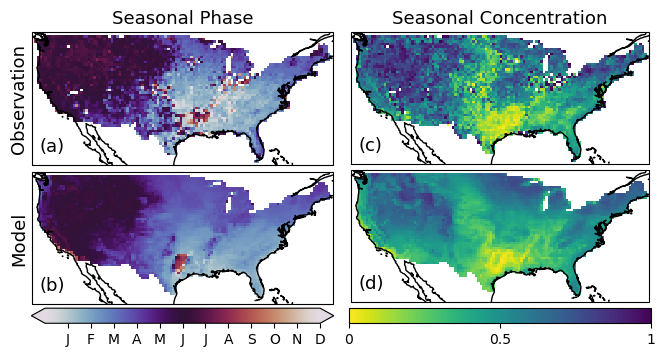

In [14]:
seasonal_concentration_and_phase(ds1, ds2, cmap1 = 'twilight')

---

In [71]:
mod_counts = ds1.p.resample(date = '1Y').sum().sum(axis = (0,1))
years = mod_counts.date.dt.year
min_year = years[mod_counts.argmin()]
max_year = years[mod_counts.argmax()]


In [72]:
min_year, max_year

(<xarray.DataArray 'year' ()>
 array(2003)
 Coordinates:
     date     datetime64[ns] 2003-12-31,
 <xarray.DataArray 'year' ()>
 array(2006)
 Coordinates:
     date     datetime64[ns] 2006-12-31)

In [69]:
def high_low_year(ds1, ds2, cmap = 'jet'):
    mod_counts = ds1.p.resample(date = '1Y').sum().sum(axis = (0,1))
    years = mod_counts.date.dt.year
    min_year = years[mod_counts.argmin()]
    max_year = years[mod_counts.argmax()]

    ds1_lo = ds1.p.sel(date = ds1.date.dt.year.isin(min_year))
    ds1_hi = ds1.p.sel(date = ds1.date.dt.year.isin(max_year))

    ds2_lo = ds2.fire.sel(date = ds2.date.dt.year.isin(min_year))
    ds2_hi = ds2.fire.sel(date = ds2.date.dt.year.isin(max_year))

    
    
    fig = plt.figure(figsize = (10, 4))

    ax1 = fig.add_subplot(221, projection=ccrs.PlateCarree())
    ax1.set_global()
    ax1.coastlines()
    ax1.set_xlim(ds1.lon.min() - 0.5, ds1.lon.max() + 0.5)
    ax1.set_ylim(ds1.lat.min() - 0.5, ds1.lat.max() + 0.5)
    ax1.text(-124, 26.5, '(a)', color = 'k', fontsize = 13, 
             bbox=dict(facecolor = 'white', edgecolor = 'white'))
    data1 = ds1_hi.mean(axis = 2).to_numpy()
    im1 = ax1.pcolormesh(
        ds1.lon, ds1.lat, data1,
        norm = colors.LogNorm(vmin = 10**-4, vmax = 10**-1, clip = False),
        cmap = cmap)


    ax2 = fig.add_subplot(223, projection=ccrs.PlateCarree())
    ax2.set_global()
    ax2.coastlines()
    ax2.set_xlim(ds1.lon.min() - 0.5, ds1.lon.max() + 0.5)
    ax2.set_ylim(ds1.lat.min() - 0.5, ds1.lat.max() + 0.5)
    ax2.text(-124, 26.5, '(b)', color = 'k', fontsize = 13, 
             bbox=dict(facecolor = 'white', edgecolor = 'white'))
    data2 = ds2_hi.mean(axis = 2).to_numpy() * (data1*0+1)
    im2 = ax2.pcolormesh(
        ds1.lon, ds1.lat, data2,
        norm = colors.LogNorm(vmin = 10**-4, vmax = 10**-1, clip = False),
        cmap = cmap)


    ax3 = fig.add_subplot(222, projection=ccrs.PlateCarree())
    ax3.set_global()
    ax3.coastlines()
    ax3.set_xlim(ds1.lon.min() - 0.5, ds1.lon.max() + 0.5)
    ax3.set_ylim(ds1.lat.min() - 0.5, ds1.lat.max() + 0.5)
    ax3.text(-124, 26.5, '(c)', color = 'k', fontsize = 13, 
             bbox=dict(facecolor = 'white', edgecolor = 'white'))
    data3 = ds1_lo.mean(axis = 2).to_numpy()
    im3 = ax3.pcolormesh(
        ds1.lon, ds1.lat, data3,
        norm = colors.LogNorm(vmin = 10**-4, vmax = 10**-1, clip = False),
        cmap = cmap)


    ax4 = fig.add_subplot(224, projection=ccrs.PlateCarree())
    ax4.set_global()
    ax4.coastlines()
    ax4.set_xlim(ds1.lon.min() - 0.5, ds1.lon.max() + 0.5)
    ax4.set_ylim(ds1.lat.min() - 0.5, ds1.lat.max() + 0.5)
    ax4.text(-124, 26.5, '(d)', color = 'k', fontsize = 13, 
             bbox=dict(facecolor = 'white', edgecolor = 'white'))
    data4 = ds2_lo.mean(axis = 2).to_numpy() * (data3*0+1)
    im4 = ax4.pcolormesh(
        ds1.lon, ds1.lat, data4,
        norm = colors.LogNorm(vmin = 10**-4, vmax = 10**-1, clip = False),
        cmap = cmap)

    plt.subplots_adjust(wspace = 0.05, hspace = 0.05)

    cbar = fig.colorbar(im3, ax = [ax1, ax2, ax3, ax4], location = 'right',
                        #ticks = ticks,
                        extend = 'both', pad = 0.03)
    cbar.set_label('Rate of Wildfire Occurrence', fontsize = 12)


    ax1.text(ds1.lon.mean(), ds1.lat.max() + 2.5, 'Highest Modelled Year',
             fontsize = 13, ha = 'center')
    ax3.text(ds1.lon.mean(), ds1.lat.max() + 2.5, 'Lowest Modelled Year',
             fontsize = 13, ha = 'center')
    ax1.text(ds1.lon.min() - 5, ds1.lat.mean(), 'Model',
             fontsize = 13, rotation = 'vertical', va = 'center')
    ax2.text(ds1.lon.min() - 5, ds1.lat.mean(), 'Observation',
             fontsize = 13, rotation = 'vertical', va = 'center')

    plt.savefig(('/rds/general/user/tk22/home/fire_genesis/'+
                 'final_paper_plots/paper/high_low_years.png'), 
                bbox_inches = 'tight', facecolor = 'white', dpi = 600)
    plt.show()
    return

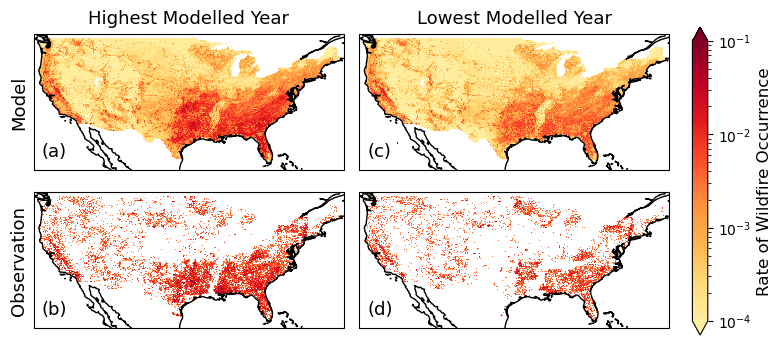

In [70]:
cmap = colors.LinearSegmentedColormap.from_list('', ['#ffeda0', '#fed976', '#feb24c',
                                                     '#fd8d3c', '#fc4e2a', '#e31a1c', '#bd0026', 
                                                     '#800026'])
high_low_year(ds1, ds2, cmap = cmap)

---

### Rate at which predictors selected

In [73]:
pred_lists = []
for J in range(0,2005):
    path = f'/rds/general/user/tk22/home/fire_genesis/predictor_sel_run/predictor_list_{J}.txt'
    try:
        with open(path) as f:
            content = f.read()
            content = [y[1:-1] for y in content[1:-1].split(', ')]
            if content:
                pred_lists.append(content)
    except:
        pass

nruns = len(pred_lists)
all_vars = [item for sublist in pred_lists for item in sublist]
variables, counts = np.unique(all_vars,return_counts = True)

In [74]:
df = pd.DataFrame({'var': variables,
                   'rate': counts/nruns})
df = df.sort_values('rate', ascending = False).reset_index(drop = True)

In [4]:
df

,var,rate
0,PopDens_rural,1.0000
1,DTR,1.0000
2,precip_5d,1.0000
3,snow_cover,0.9985
4,VPD_night,0.9810
5,GPP_1y,0.9065
6,TREE,0.7495
7,alpha_mean,0.6640
8,precip,0.6440
9,SHRUB,0.5805


In [75]:
def pred_sel_rate():
    pred_lists = []
    for J in range(0,2005):
        path = f'/rds/general/user/tk22/home/fire_genesis/predictor_sel_run/predictor_list_{J}.txt'
        try:
            with open(path) as f:
                content = f.read()
                content = [y[1:-1] for y in content[1:-1].split(', ')]
                if content:
                    pred_lists.append(content)
        except:
            pass

    nruns = len(pred_lists)
    all_vars = [item for sublist in pred_lists for item in sublist]
    variables, counts = np.unique(all_vars,return_counts = True)

    df = pd.DataFrame({'var': variables,
                       'rate': counts/nruns})
    df = df.sort_values('rate', ascending = False).reset_index(drop = True)

    var_names = ['Rural Population Density', 'DTR', 'Precipitation (5 days)', 'Snow Cover Fraction',
                 'Night-time VPD', 'GPP (1 year)', 'Tree Cover Fraction', 'Aridity',
                 'Daily Precipitation', 'Shrub Cover Fraction', 'GPP (50 days)',
                 'Herb Cover Fraction', 'Mean Daily Temperature', 'GPP (100 days)', 'Insolation',
                 'Crop Cover Fraction', 'VPD (1 month)', 'Elevation', 'Daily VPD', 'VPD (10 days)',
                 'GPP (2 years)', 'Soil Moisture', 'Needleleaf Cover Fraction', 'GPP (10 years)',
                 'Relative Humidity']


    color_codes = ['dimgrey', 'navajowhite', 'navajowhite', 'navajowhite', 'navajowhite', 'mediumseagreen',
                   'mediumseagreen', 'navajowhite', 'navajowhite', 'mediumseagreen', 'mediumseagreen',
                   'mediumseagreen', 'navajowhite', 'mediumseagreen', 'navajowhite', 'dimgrey', 'navajowhite',
                   'dimgrey', 'navajowhite', 'navajowhite', 'mediumseagreen', 'navajowhite', 'mediumseagreen',
                   'mediumseagreen', 'navajowhite']

    plt.figure(figsize = (4,6))
    plt.barh(var_names, df[df.rate > 0.01]['rate'], color = color_codes)
    plt.xlabel('Variable Selection Rate')

    colors = {'Meteorological':'navajowhite',
              'Vegetation':'mediumseagreen',
              'Human/Landscape':'dimgrey'}    
    labels = list(colors.keys())
    handles = [plt.Rectangle((0,0),1,1,
                             color=colors[label]) for label in labels]
    plt.legend(handles, labels)
    
    plt.savefig(('/rds/general/user/tk22/home/fire_genesis/'+
                 'final_paper_plots/paper/selection_rate.png'), 
                bbox_inches = 'tight', facecolor = 'white', dpi = 600)
    plt.show()
    
    return

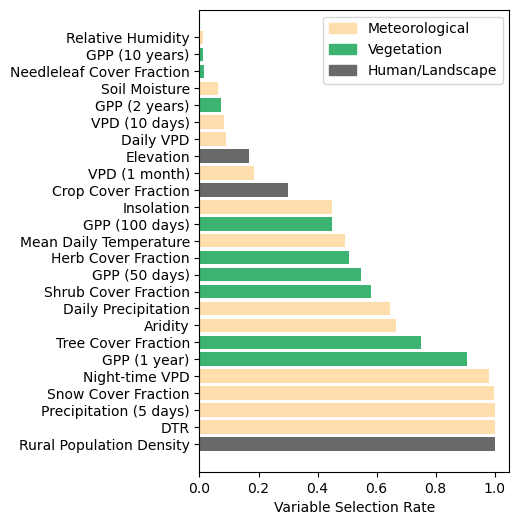

In [76]:
pred_sel_rate()

----
### Weekly Maps:

2002


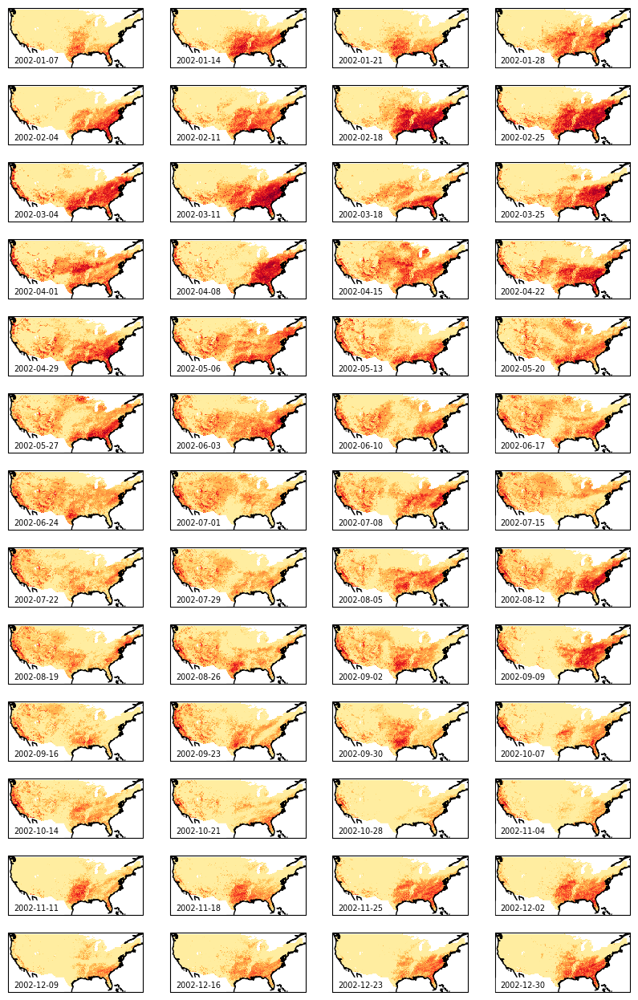

2003


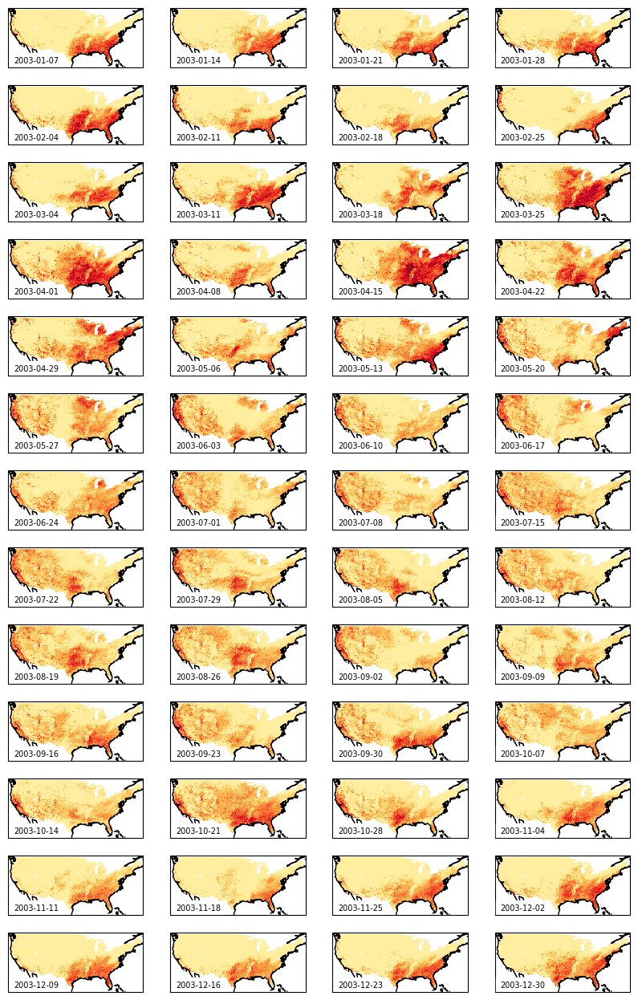

2004


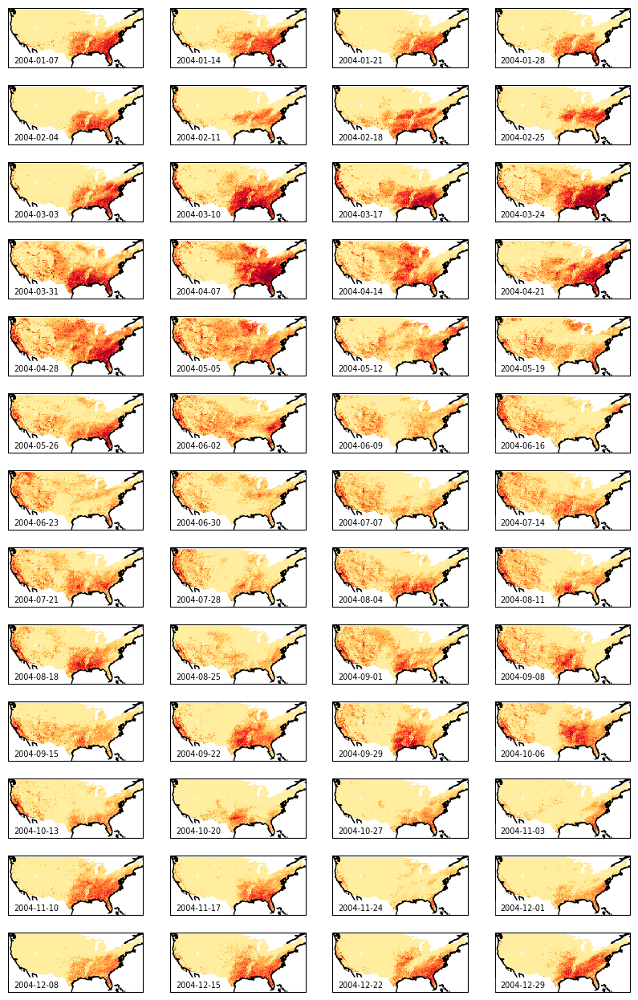

2005


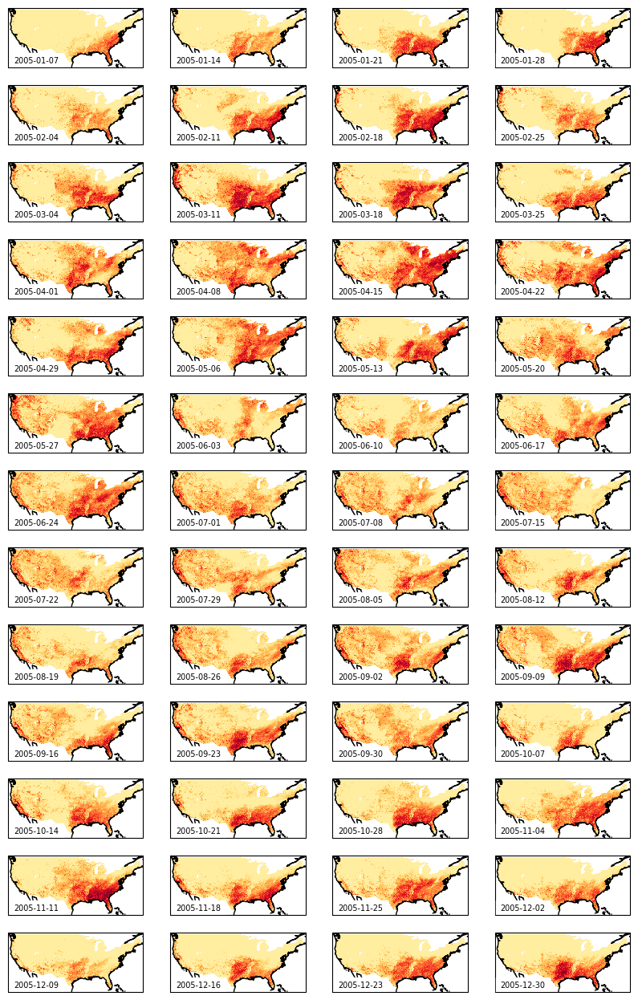

2006


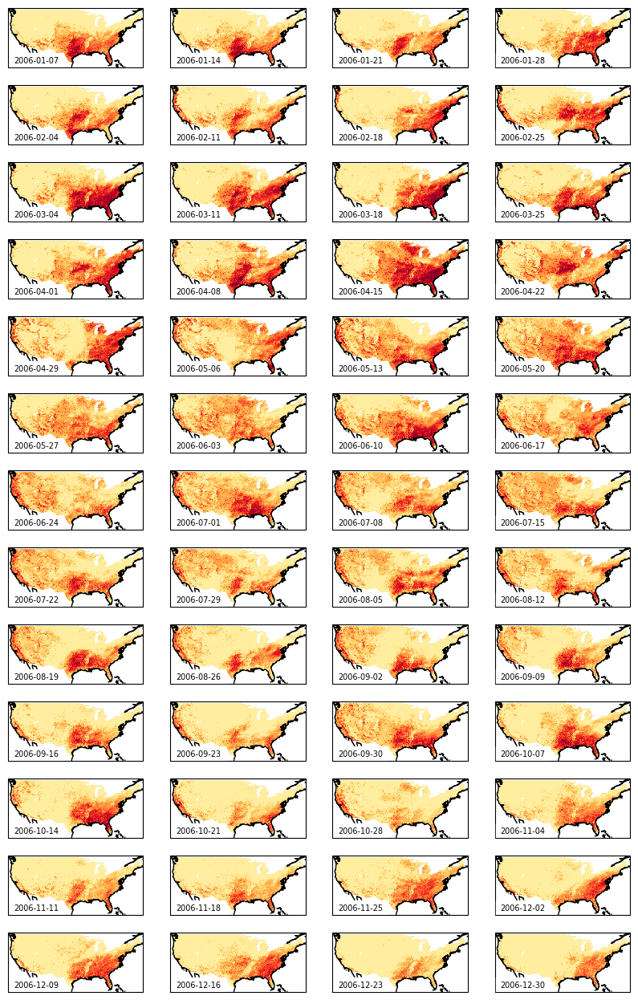

2007


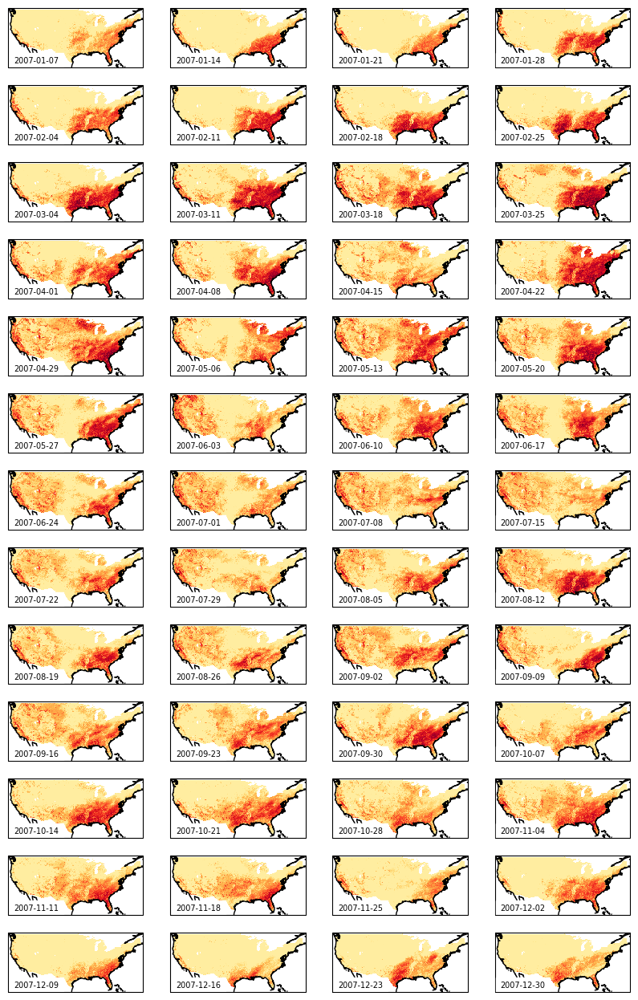

2008


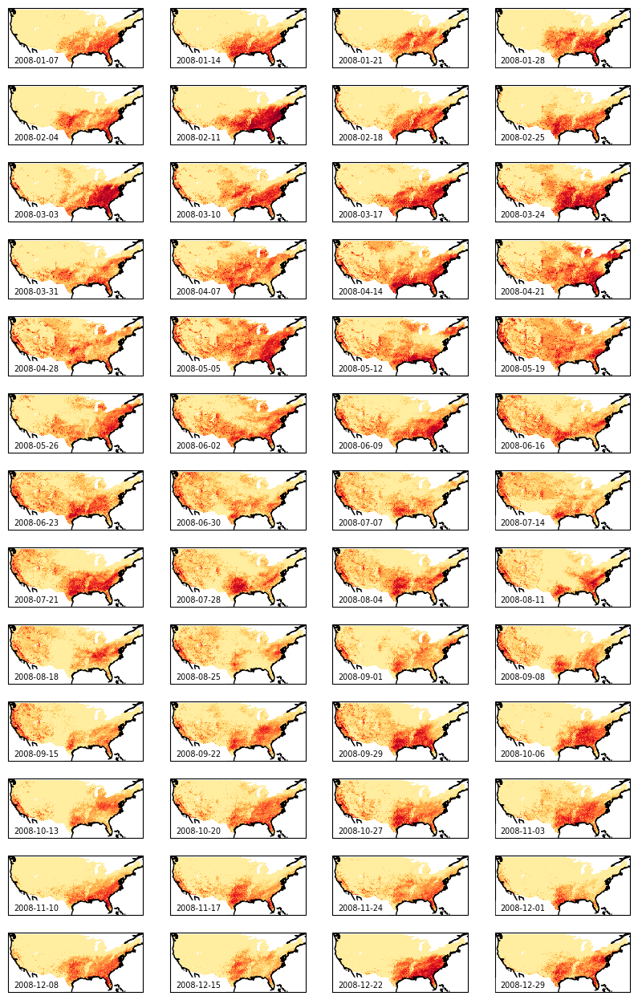

2009


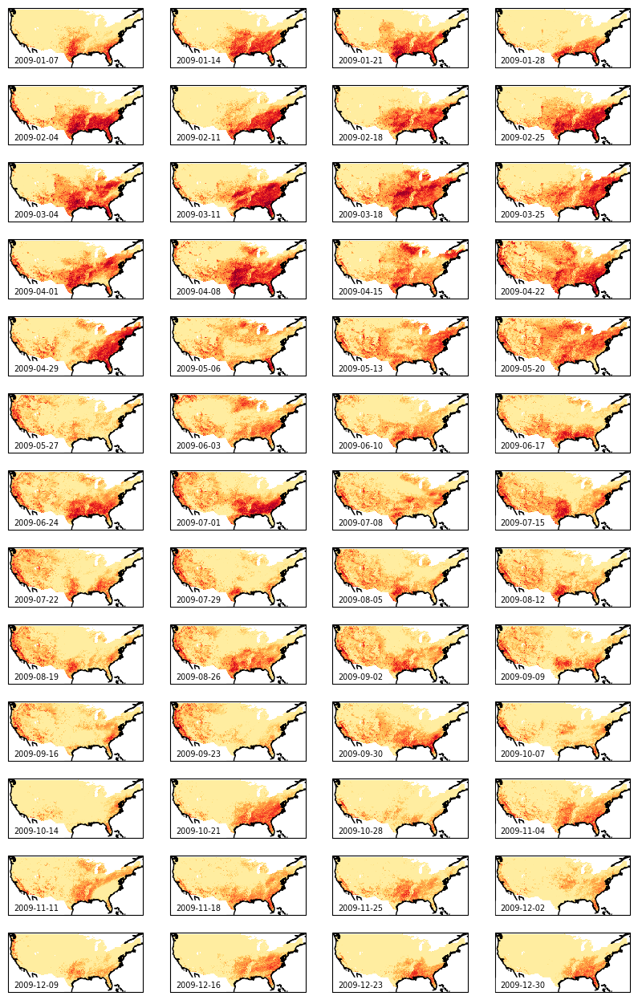

2010


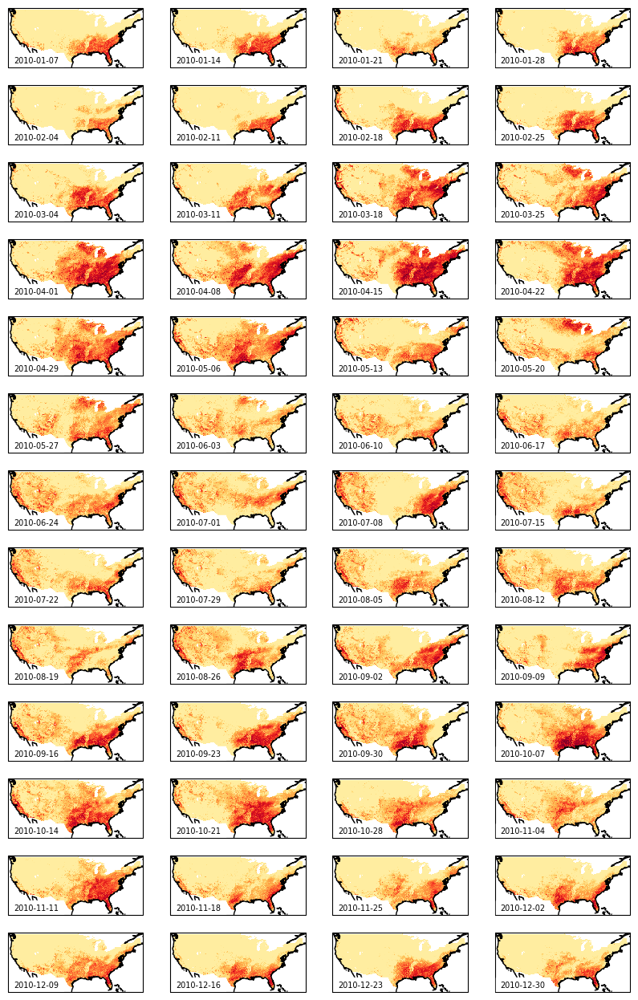

2011


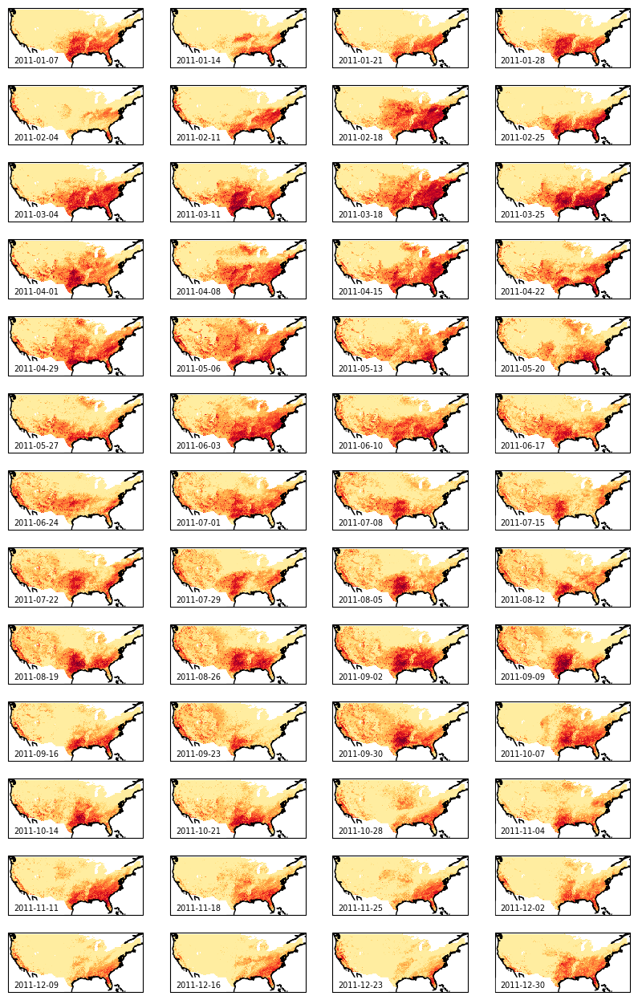

2012


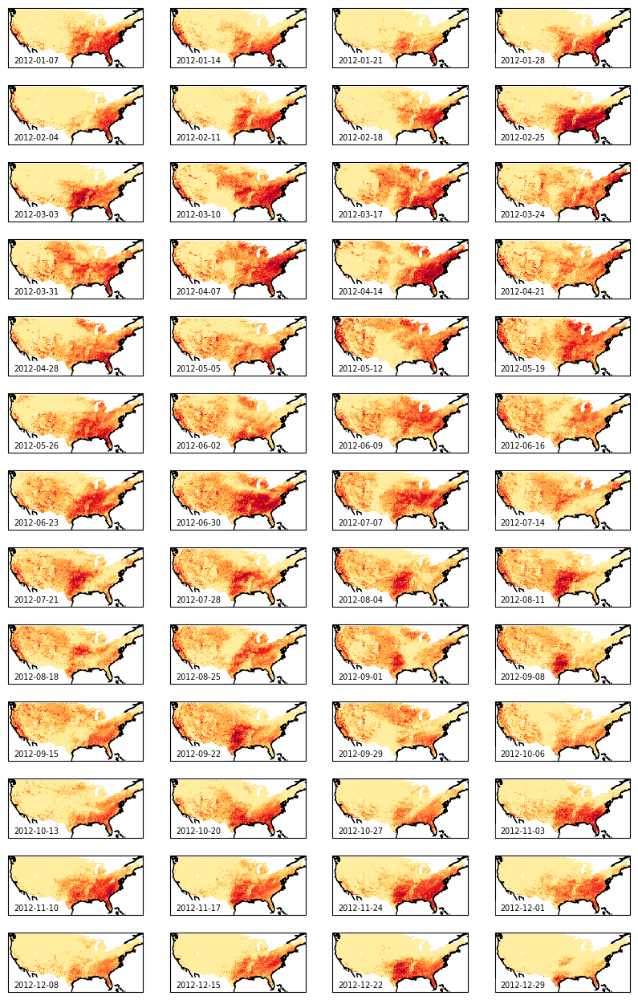

2013


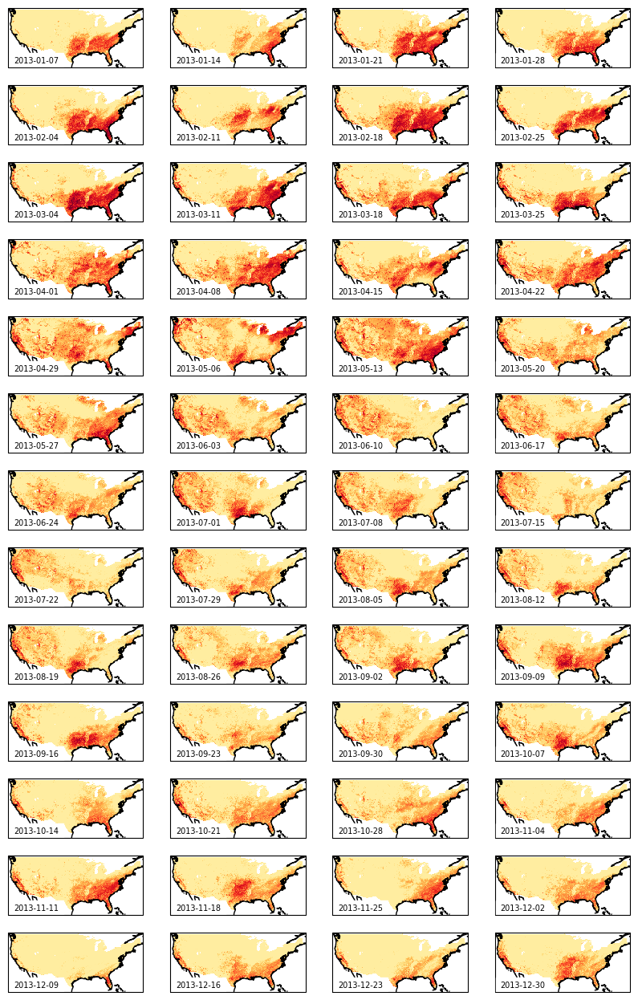

2014


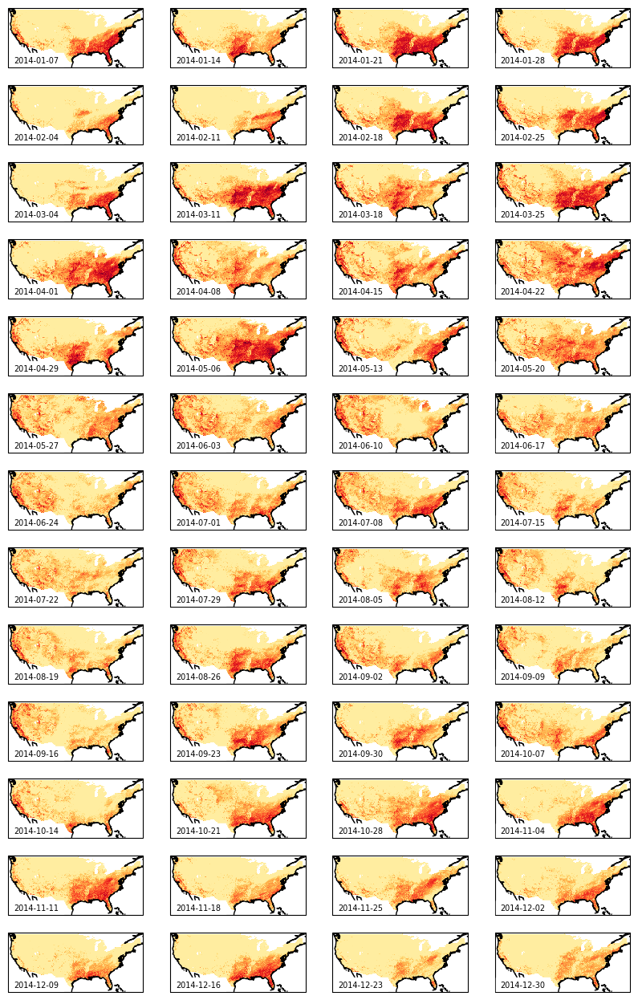

2015


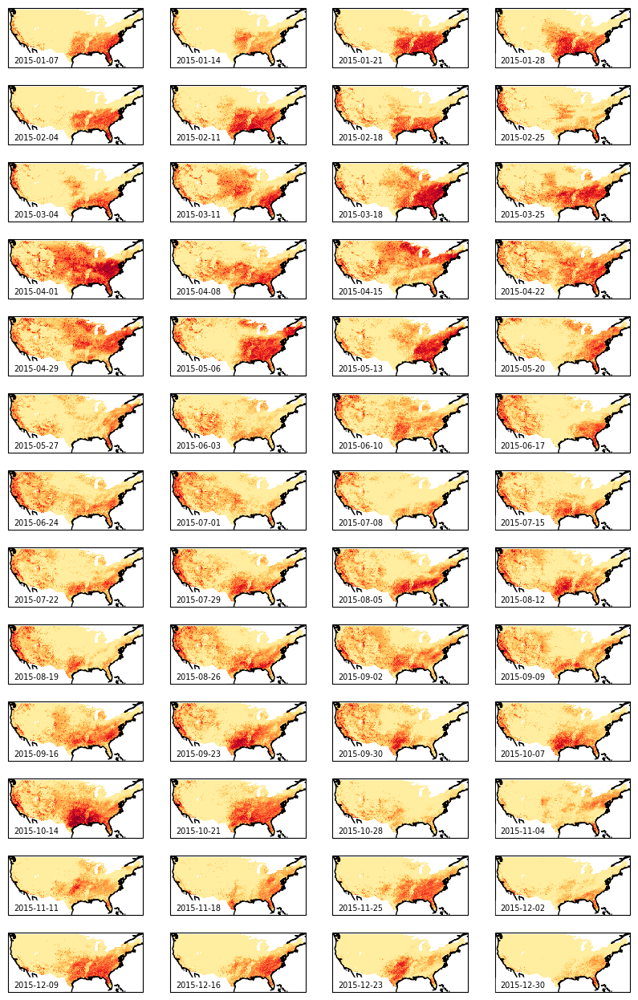

2016


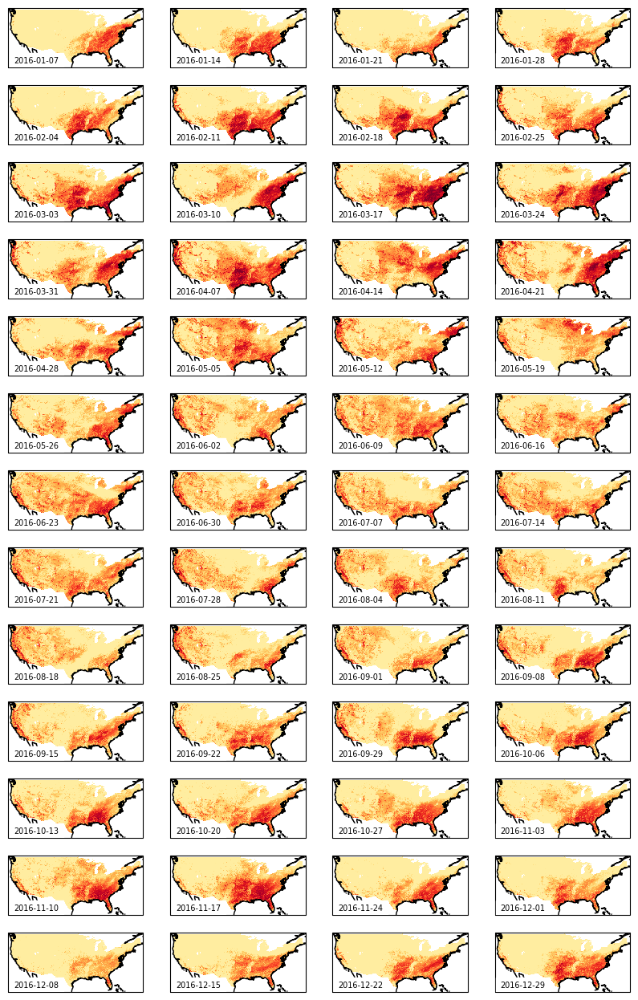

2017


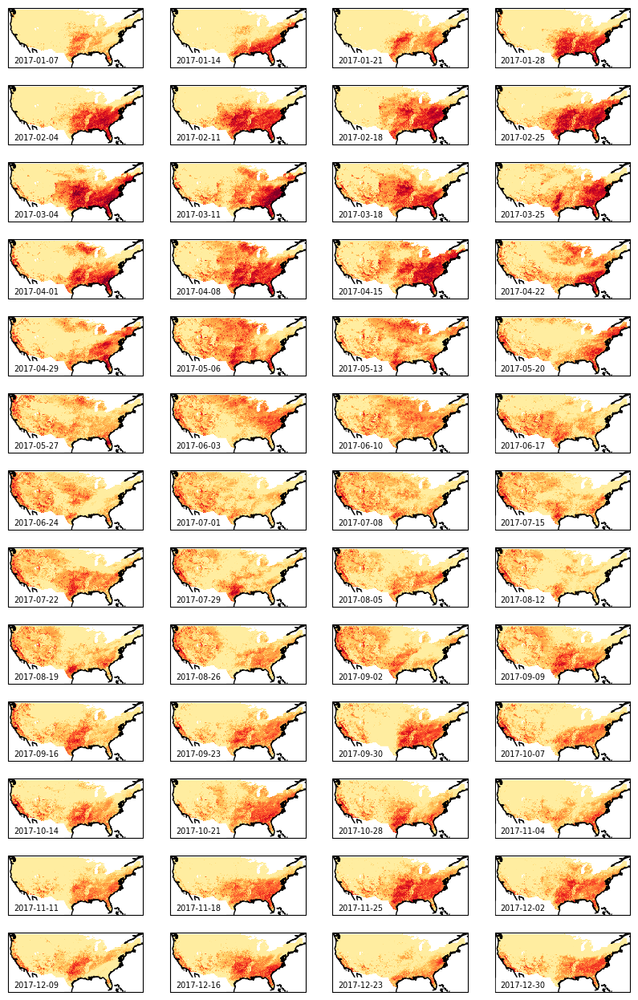

2018


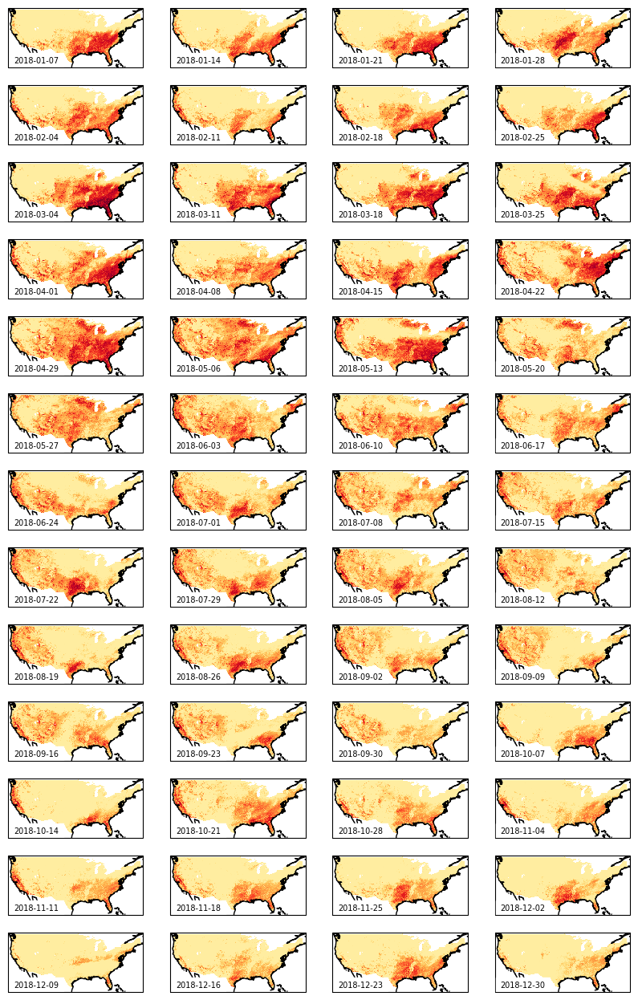

In [48]:
for year in range(2002,2019):
    print(year)
    dates = np.array(ds1.date[ds1.date.dt.year == year][6::7])
    cmap = colors.LinearSegmentedColormap.from_list('', ['#ffeda0', '#fed976', '#feb24c',
                                                         '#fd8d3c', '#fc4e2a', '#e31a1c', '#bd0026', 
                                                         '#800026'])

    fig, axs = plt.subplots(13, 4, figsize = (10,16),
                            subplot_kw={'projection': ccrs.PlateCarree()})
    for i, ax in enumerate(axs.flatten()):
        #print(i)
        ax.set_global()
        ax.coastlines()
        ax.set_xlim(ds1.lon.min() - 0.5, ds1.lon.max() + 0.5)
        ax.set_ylim(ds1.lat.min() - 0.5, ds1.lat.max() + 0.5)

        index = np.argwhere(ds1.date.data == dates[i])[0][0]
        date = dates[i]

        data = ds1.p[:,:,index].to_numpy()

        im = ax.pcolormesh(
            ds1.lon, ds1.lat, data,
            norm = colors.LogNorm(vmin = 10**-4, vmax = 10**-1, clip = False),
            transform = ccrs.PlateCarree(),
            cmap = cmap)

        ax.text(-123, 25.5, str(date)[:10], color = 'k', fontsize = 7, clip_on=True,
                bbox=dict(facecolor = 'white', edgecolor = 'white'))

    plt.savefig(('/rds/general/user/tk22/home/fire_genesis/'+
                 f'final_paper_plots/paper/weekly_maps_{year}.png'), 
                bbox_inches = 'tight', facecolor = 'white', dpi = 600)
    plt.show()